Introduxtion TO NLP

<p>Verify Zipf’s law on a textual corpus. The jungle book dataset is provided in the "Datasets and Resources" file. (You can also use any other dataset of your choice). <p>

<p> Provide a list of unique word sorted by their frequency in descending order. Also, give a brief discussion of the findings. You can use matplotlib library to plot the linear curve, and a log-log curve. The usage of other python modules is not permitted.</p>

In [166]:
import pandas as pd
import re 
data = open('jungle_book.txt', 'r').read()
stopwords = ['i','me', 'my','myself','we','our','ours','ourselves','you',"you're","you've","you'll","you'd",'your','yours','yourself','yourselves','he','him','his','himself','she',"she's",'her','it','herself',"it's",'its','itself','they','them','hers','their','themselves','what','theirs','which','who','whom','this','that',"that'll",'these','those','am','is','are','was','were','be','been','being','have','has','had','having','do','does','did','doing','a','an','the','and','but','if','or','because','as','until','while','of','at','by','for','with','about','against','between','into','through','during','before','after','above','below','to','from','up','down','in','out','on','off','over','under','again','further','then','once','here','there','when','where','why','how','all','any','both','each','few','more','most','other','some','such','no','nor','not','only','own','same','so','than','too','very','s','t','can','will','just','don',"don't",'should',"should've",'now','d','ll','m','o','re','ve','y','ain','aren',"aren't",'couldn',"couldn't",'didn',"didn't",'doesn',"doesn't",'hadn',"hadn't",'hasn',"hasn't",'haven',"haven't",'isn',"isn't",'ma','mightn',"mightn't",'mustn',"mustn't",'needn',"needn't",'shan',"shan't",'shouldn',"shouldn't",'wasn',"wasn't",'weren',"weren't",'won',"won't",'wouldn',"wouldn't"]
def text_preprocess(data):
    data = re.sub(r'\n\n', ' ', data)
    data = re.sub(r'\n', ' ', data)
    data = re.sub(r'[\.\,\:\;\'\"\(\)\!\#\$\*\[\]]', '', data)
    data = data.split(' ')
    data = [x.lower() for x in data if x != '' and x.isalpha()]
    data = [x for x in data if x not in stopwords]
    return data

data = text_preprocess(data)
data = pd.DataFrame(data)
data = data.rename(columns={0: 'word'})
data = data.groupby('word').size().reset_index(name='count')
data = data.sort_values(by='count', ascending=False)
data = data.reset_index(drop=True)

print(data)

#first row is empty, so we remove it
data = data.drop(data.index[0])

# word are unique? letes test it
print('Are words unique?')
print(data['word'].is_unique)



            word  count
0           said    441
1         little    240
2         mowgli    210
3            one    191
4          would    164
...          ...    ...
4686  fastenings      1
4687      fathom      1
4688      fatter      1
4689    prowling      1
4690       aaarh      1

[4691 rows x 2 columns]
Are words unique?
True


In [167]:
import matplotlib.pyplot as plt


# data_plt = data.head(20)
# x = data_plt['word']
# y = data_plt['count']

# data_plt.plot(kind='line', x='word', y='count', marker = 'o',figsize=(10, 6), grid=True)
# plt.xticks(rotation=90)
# plt.xticks(ticks=range(0, 20), labels=x)
# plt.title('Top 20 most frequent words in The Jungle Book')

# plt.show()

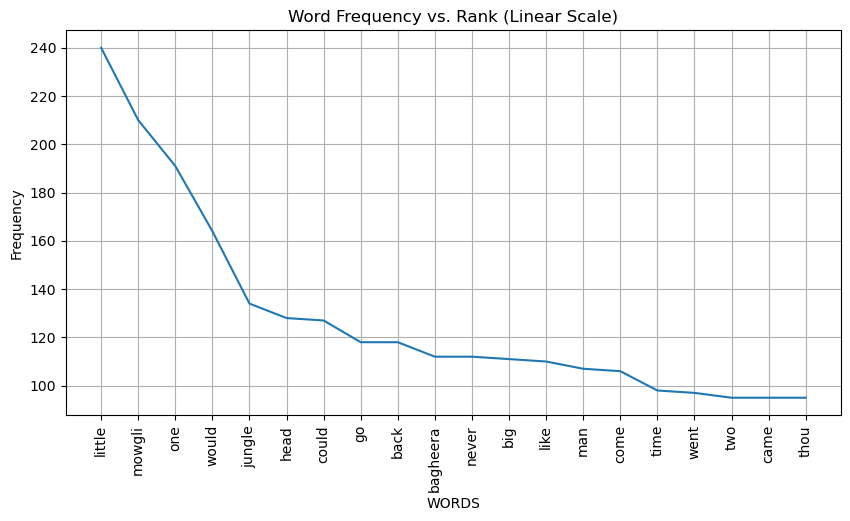

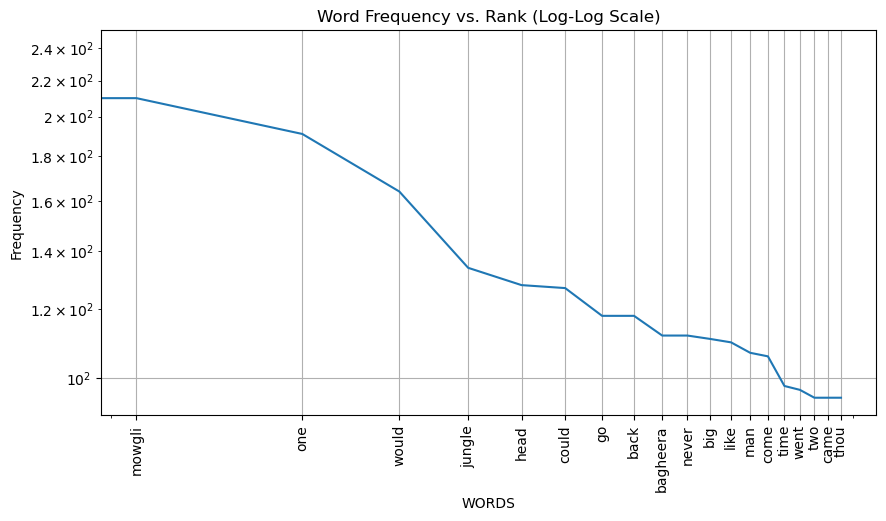

In [168]:

# Linear curve
plt.figure(figsize=(10, 5))
plt.plot(x, y)
plt.title('Word Frequency vs. Rank (Linear Scale)')
plt.xlabel('WORDS')
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


# Log-log curve
plt.figure(figsize=(10, 5))
plt.loglog(x, y)
plt.title('Word Frequency vs. Rank (Log-Log Scale)')
plt.xlabel('WORDS')
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


### Question 2: Mutual Information *(30 points)*

<p>Pointwise mutual information quantifies the statistical dependence between events ${x_{t} = w_{1} }$ and ${ x_{t+1} = w_{2}}$. ${C(w)}$ is the absolute frequency and ${N}$ is the size of the corpus. If the probability of the next word in the corpus (${w_{2}}$) is affected by the probability of the previous word (${w_{1}}$), then ${pmi(w_{1},w_{2}) = 0}$; else the pmi value is either positive or negative. </p>

$$ pmi(w_{1},w_{2}) = log \frac{P(x_{t} = w_{1}, x_{t+1} = w_{2})} {P(x_{t} = w_{1}) . P(x_{t+1} = w_{2})} \approx log \frac {C(w_{1}w_{2}) . N} {C(w_{1}) . C(w_{2})}  $$

<p>Calculate the Pointwise mutual information (PMI) for all successive word pairs (w1, w2) in the jungle book corpus. Words (not word pairs) that occur in the corpus less than 10 times should be ignored. List the 30 word pairs with the highest pmi value and the 30 word pairs with the lowest pmi value. Document your observations and discuss the validity of the independence assumption for unigram models. If needed, you can use nltk library. </p>

In [169]:
#first we need not ordered data, clean data but i want to keep the original data dont want to delete duplicates.

data2 = open('jungle_book.txt', 'r').read()
# print(len(data2))
data2 = re.sub(r'\n\n', ' ', data2)
data2 = re.sub(r'\n', ' ', data2)
data2 = re.sub(r'[\.\,\:\;\'\"\(\)\!\#\$\*\[\]]', '', data2)
data2 = data2.split(' ')
data2 = [x.lower() for x in data2]
data2 = pd.DataFrame(data2)
data2 = data2.rename(columns={0: 'word'})
# print(len(data2))

data3 = data2.groupby('word').size().reset_index(name='count')

# print(len(data2))

#merge data3 with data2
data2 = pd.merge(data2, data3, on='word', how='left')

# print(len(data2))

#delete empty row
data2 = data2[data2['word'] != '']

# delete data that occurs less than 10 times
data2 = data2[data2['count'] >= 10]

data2 = data2.reset_index(drop=True)

print(len(data2))



# calculate the PMI


# P(W) = count(w) / total words
# this is the probability of a word occuring in the text independent of any other word
len_data = len(data2)
data2['P_w/total'] = data2['count'] / len_data


# P(W1, W2) = count(w1, w2) / total words
# this is the probability of two words occuring together in the text next to each other
# we will calculate this by counting the number of times two words occur together in the text

data2['word_next'] = data2['word'].shift(-1) # shift the word column by one to get the next word

data2['word_pair'] = data2['word'] + ' ' + data2['word_next']

# print(data2)
data3 = data2.copy()

#for pair calculation
data3 = data2.copy()
data3 = data3.groupby('word_pair').size().reset_index(name='count_pair')

data3['P_w1_w2/total'] = data3['count_pair'] / len_data

# print(data3)

import math

data4 = pd.merge(data2,data3, on='word_pair', how='outer')
data4['PMI'] = (data4['P_w1_w2/total'] / (data4['P_w/total'] * data4['P_w/total'].shift(-1))).apply(lambda x: math.log2(x))
#delete last row
data4 = data4.drop(data4.index[-1])
# add PMI COL TO DATA4

# print(data4)
# unique word_pair and sort by PMI
data5= data4.drop_duplicates(subset=['word_pair']).reset_index(drop=True)
data5 = data5.sort_values(by='PMI', ascending=False)
print(data5)



# list 30 highest PMI WORD PAIRS in a list
print("MOST 30 PMI WORD PAIRS IN A LIST")
list_head_30 = data5['word_pair'].head(30).tolist()
print(list_head_30)


# list 30 lowest PMI WORD PAIRS in a list
print("LEAST 30 PMI WORD PAIRS IN A LIST")
list_tail_30 = data5['word_pair'].tail(30).tolist()
print(list_tail_30)




43738
         word  count  P_w/total word_next      word_pair  count_pair  \
15138  trying     10   0.000229        to      trying to        10.0   
15268  united     10   0.000229    states  united states        10.0   
327    access     10   0.000229        to      access to        10.0   
8461   machua     10   0.000229      appa    machua appa         9.0   
15041     top     11   0.000251        of         top of        10.0   
...       ...    ...        ...       ...            ...         ...   
13539     the   3694   0.084457      must       the must         1.0   
13520     the   3694   0.084457    matkah     the matkah         1.0   
13512     the   3694   0.084457    looked     the looked         1.0   
13509     the   3694   0.084457     lives      the lives         1.0   
13558     the   3694   0.084457      nuts       the nuts         1.0   

       P_w1_w2/total        PMI  
15138       0.000229  12.094672  
15268       0.000229  12.094672  
327         0.000229  12.09

### Question 3: Wikipedia language model *(50 points)*

<p> A customer of yours is dissatisfied with the quality of the speech recognition. After a conversation with the customer, you find out that he dictates books. The initial investigations on a book excerpt have shown that the language model used is not suitable. For building a better language model for the application, you have asked your customer to provide a text from the book (see "Datasets and Resources") </p>

<p> In order to save costs and also to avoid problems with copyrights, your company has decided not to use existing solutions for this project. So, you have to implement a 2-gram language model in Python from scratch. Include a short description of the data preprocessing steps, method, experiment design, hyper-parameters, and evaluation metric. Also, document your findings, drawbacks, and potential improvements. Finally, compare the performance of the language model with and without Backoff.</p>

<p> You cannot use any Python libraries like NLTK. If you need to use special Python modules, you can discuss with your instructor before submission. </p>

<h4> Datasets and Resources </h4> 

* WikiText-2 (raw/unprocessed), Train, Dev, Test

In [170]:
stopwords = ['i','me', 'my','myself','we','our','ours','ourselves','you',"you're","you've","you'll","you'd",'your','yours','yourself','yourselves','he','him','his','himself','she',"she's",'her','it','herself',"it's",'its','itself','they','them','hers','their','themselves','what','theirs','which','who','whom','this','that',"that'll",'these','those','am','is','are','was','were','be','been','being','have','has','had','having','do','does','did','doing','a','an','the','and','but','if','or','because','as','until','while','of','at','by','for','with','about','against','between','into','through','during','before','after','above','below','to','from','up','down','in','out','on','off','over','under','again','further','then','once','here','there','when','where','why','how','all','any','both','each','few','more','most','other','some','such','no','nor','not','only','own','same','so','than','too','very','s','t','can','will','just','don',"don't",'should',"should've",'now','d','ll','m','o','re','ve','y','ain','aren',"aren't",'couldn',"couldn't",'didn',"didn't",'doesn',"doesn't",'hadn',"hadn't",'hasn',"hasn't",'haven',"haven't",'isn',"isn't",'ma','mightn',"mightn't",'mustn',"mustn't",'needn',"needn't",'shan',"shan't",'shouldn',"shouldn't",'wasn',"wasn't",'weren',"weren't",'won',"won't",'wouldn',"wouldn't"]
def text_preprocess(data):
    data = re.sub(r'\n\n', ' ', data)
    data = re.sub(r'\n', ' ', data)
    data = re.sub(r'[\.\,\:\;\'\"\(\)\!\#\$\*\[\]]', '', data)
    data = data.split(' ')
    data = [x.lower() for x in data if x != '' and x.isalpha()]
    data = [x for x in data if x not in stopwords]
    return data


# Dta Preprocessing
'''
steps:
1. remove newline characters
2. remove special characters
3. split the text into words
4. convert the words to lowercase
5. remove empty strings
6. remove stopwords

Drawbacks: This approach might be too aggressive and remove some informative words

'''


'\nsteps:\n1. remove newline characters\n2. remove special characters\n3. split the text into words\n4. convert the words to lowercase\n5. remove empty strings\n6. remove stopwords\n\nDrawbacks: This approach might be too aggressive and remove some informative words\n\n'

In [171]:
#DATA CLEANING AND 1-GRAM.

wikidata = open('wiki.train.raw', 'r').read()
wikidata = text_preprocess(wikidata)

# uni gram
#count the number of words in the text and create dictionary of word and its count
unigram_dict = {}
for word in wikidata:
    if word in unigram_dict:
        unigram_dict[word] += 1
    else:
        unigram_dict[word] = 1

#calculate probability of each word
total_words = len(wikidata)
for word in unigram_dict:
    unigram_dict[word] = unigram_dict[word] / total_words

print(unigram_dict)




{'valkyria': 5.555949959410699e-05, 'chronicles': 5.4530619971993896e-05, 'iii': 0.00023767119270812434, 'senjō': 5.144398110565462e-06, 'unrecorded': 4.11551848845237e-06, 'japanese': 0.0002623643036388386, 'lit': 3.086638866339277e-05, 'battlefield': 3.909742564029751e-05, 'commonly': 0.000122436675031458, 'referred': 0.00021297808177741013, 'outside': 0.00031792380323294555, 'japan': 0.00021812247988797559, 'tactical': 3.3953027529732046e-05, 'role': 0.0006152700140236293, 'playing': 0.0003518768307626776, 'video': 0.000745937726031992, 'game': 0.002136982975128893, 'developed': 0.00044138935788651663, 'sega': 9.25991659901783e-06, 'mediavision': 4.11551848845237e-06, 'playstation': 0.00012758107314202345, 'portable': 3.3953027529732046e-05, 'released': 0.0010072731500487175, 'january': 0.0007150713373685992, 'third': 0.0007366778094329741, 'series': 0.0015412616739254124, 'employing': 1.9548712820148756e-05, 'fusion': 4.629958299508916e-05, 'real': 0.00027882637759264804, 'time': 0

In [172]:
#bigram
#count the number of word pairs in the text and create dictionary of word pair and its count
bigram_dict = {}
for i in range(len(wikidata) - 1):
    word_pair = wikidata[i] + ' ' + wikidata[i + 1]
    if word_pair in bigram_dict:
        bigram_dict[word_pair] += 1
    else:
        bigram_dict[word_pair] = 1

print(bigram_dict)


{'valkyria chronicles': 36, 'chronicles iii': 15, 'iii senjō': 1, 'senjō valkyria': 5, 'valkyria unrecorded': 1, 'unrecorded chronicles': 1, 'chronicles japanese': 1, 'japanese lit': 1, 'lit valkyria': 4, 'valkyria battlefield': 4, 'battlefield commonly': 1, 'commonly referred': 8, 'referred valkyria': 1, 'iii outside': 1, 'outside japan': 8, 'japan tactical': 1, 'tactical role': 3, 'role playing': 20, 'playing video': 8, 'video game': 109, 'game developed': 18, 'developed sega': 1, 'sega mediavision': 1, 'mediavision playstation': 1, 'playstation portable': 15, 'portable released': 2, 'released january': 12, 'january japan': 1, 'japan third': 1, 'third game': 13, 'game valkyria': 2, 'valkyria series': 2, 'series employing': 1, 'employing fusion': 1, 'fusion tactical': 1, 'tactical real': 1, 'real time': 10, 'time gameplay': 1, 'gameplay predecessors': 1, 'predecessors story': 1, 'story runs': 1, 'runs parallel': 6, 'parallel first': 1, 'first game': 74, 'game follows': 3, 'follows nam

In [173]:
#bigram_probs: A dictionary mapping bigrams (tuples of words) to their bigram probabilities.
bigram_probs = {}
for word_pair in bigram_dict:
    word1, word2 = word_pair.split(' ')
    bigram_probs[word_pair] = bigram_dict[word_pair] / unigram_dict[word1]

print(len(bigram_probs))

743957


In [174]:
# calculate perplexity of the test data with and without backoff


def perplexity(test_data, unigram_dict, bigram_dict, backoff=False):
    total_words = len(test_data)
    log_probability = 0

    for i in range(total_words):
        word = test_data[i]

        if backoff and i > 0:  # if backoff enabled and not the first word
            # Get previous word
            prev_word = test_data[i - 1]
            bigram = prev_word + " " + word

            # Check if bigram exists in bigram dictionary
            if bigram in bigram_dict and bigram_dict[bigram] > 0:
                log_probability += math.log(bigram_dict[bigram])  # Add log probability
            else:
                # Backoff to unigram probability of previous word
                log_probability += math.log(unigram_dict.get(prev_word, 1e-9))  # Handle unseen words with very small probability (1e-9) / smoothing

        # Check if word exists in unigram dict
        elif word in unigram_dict:
            log_probability += math.log(unigram_dict[word])  # Add log probability

        else:
            # Assign a small probability for unseen words (no backoff) / smoothing
            log_probability += math.log(1e-9)

    # Calculate perplexity
    perplexity_value = math.exp(-log_probability / total_words)
    return perplexity_value




In [175]:
# Test data preprocessing (assuming text_preprocess function exists)
test_data = open('wiki.test.raw', 'r').read()
test_data = text_preprocess(test_data)

# Evaluate perplexity with Backoff
perplexity_backoff = perplexity(test_data, unigram_dict, bigram_dict, backoff=True)
print(f"Perplexity with Backoff: {perplexity_backoff:.2f}")

# Evaluate perplexity without Backoff
perplexity_no_backoff = perplexity(test_data, unigram_dict, bigram_dict, backoff=False)
print(f"Perplexity without Backoff: {perplexity_no_backoff:.2f}")

Perplexity with Backoff: 2191.95
Perplexity without Backoff: 20549.15


In [176]:
# Validate the results with validation data
validation_data = open('wiki.valid.raw', 'r').read()
validation_data = text_preprocess(validation_data)

# Evaluate perplexity with Backoff
perplexity_backoff = perplexity(validation_data, unigram_dict, bigram_dict, backoff=True)
print(f"Perplexity with Backoff: {perplexity_backoff:.2f}")

# Evaluate perplexity without Backoff
perplexity_no_backoff = perplexity(validation_data, unigram_dict, bigram_dict, backoff=False)
print(f"Perplexity without Backoff: {perplexity_no_backoff:.2f}")



Perplexity with Backoff: 1606.71
Perplexity without Backoff: 16525.96


In [177]:
# with dataframes


#UNi gram probabilty
wikidata_unigram= wikidata.copy()
wikidata_unigram = pd.DataFrame(wikidata_unigram)
print(wikidata_unigram)
wikidata_unigram = wikidata_unigram.rename(columns={0: 'word'})
wikidata_unigram_grouped = wikidata_unigram.groupby("word").size().reset_index(name='count')
wikidata_unigram_grouped = wikidata_unigram_grouped.sort_values(by='count', ascending=False).reset_index(drop=True)

# print(wikidata_unigram_grouped)
wikidata_unigram_grouped['P_w/total'] = wikidata_unigram_grouped['count'] / len(wikidata)

# print(wikidata_unigram_grouped)



#BIGRAM
wikidata_bigram = wikidata.copy()
wikidata_bigram = pd.DataFrame(wikidata_bigram)
wikidata_bigram = wikidata_bigram.rename(columns={0: 'word'})
wikidata_bigram['word_next'] = wikidata_bigram['word'].shift(-1)
wikidata_bigram['word_pair'] = wikidata_bigram['word'] + ' ' + wikidata_bigram['word_next']
wikidata_bigram = wikidata_bigram.dropna()
wikidata_bigram = wikidata_bigram.reset_index(drop=True)
# print(wikidata_bigram)


# word pair count

wikidata_bigram_grouped = wikidata_bigram.groupby('word_pair').size().reset_index(name='count_pair')
wikidata_bigram_grouped['P_w1_w2/total'] = wikidata_bigram_grouped['count_pair'] / len(wikidata)
#sort by count_pair
wikidata_bigram_grouped = wikidata_bigram_grouped.sort_values(by='count_pair', ascending=False).reset_index(drop=True)
# print(wikidata_bigram_grouped)

# merge tables

bigram_together = pd.merge(wikidata_bigram, wikidata_bigram_grouped, on='word_pair', how='outer')
# print(bigram_together)

# merge with unigram
together = pd.merge(bigram_together, wikidata_unigram_grouped, left_on='word', right_on='word', how='outer')
print(together)

                 0
0         valkyria
1       chronicles
2              iii
3            senjō
4         valkyria
...            ...
971926         may
971927       still
971928        seen
971929    acquired
971930       taste

[971931 rows x 1 columns]
       word    word_next      word_pair  count_pair  P_w1_w2/total  count  \
0        aa    affiliate   aa affiliate           1       0.000001     30   
1        aa           ar          aa ar           1       0.000001     30   
2        aa     armament    aa armament           1       0.000001     30   
3        aa           bb          aa bb           1       0.000001     30   
4        aa      defence     aa defence           2       0.000002     30   
...     ...          ...            ...         ...            ...    ...   
971925  高円寺          さゆり        高円寺 さゆり           1       0.000001      1   
971926  龍神村          lit        龍神村 lit           1       0.000001      1   
971927   알라         alla        알라 alla           1 

In [178]:
# print the most probable word after a given word

def most_probable_next_word(word):
    a = bigram_together.loc[bigram_together['word'] == word].sort_values(by='P_w1_w2/total', ascending=False).head(1)  # sort by P(w1, w2) and get the first row
    a = a.to_records() # convert to a numpy array
    return a[0][2] # get the second column of the first row

print(most_probable_next_word('valkyria'))

chronicles


In [179]:
# I am going to create a function that generates a sentence with 5 words. The function will take a word as input and generate the next word based on the most probable word pair. 
#It will then generate the next word based on the most probable word pair with the previous word, and so on, until it has generated 5 words.



def generate_sentence(word):
    sentence = [word]
    for i in range(4):
        word = most_probable_next_word(word)
        sentence.append(word)
    return ' '.join(sentence)

print(generate_sentence('exchange'))


exchange program called song dynasty


In [185]:
# geneterate sentence with randomly selected word from wikidata

import random

def generate_sentence_random():
    word = random.choice(wikidata)
    return generate_sentence(word)

print(generate_sentence_random())

construction new york city council


66582
<FreqDist with 6368 samples and 66582 outcomes>
38763
26101
<FreqDist with 5292 samples and 26101 outcomes>


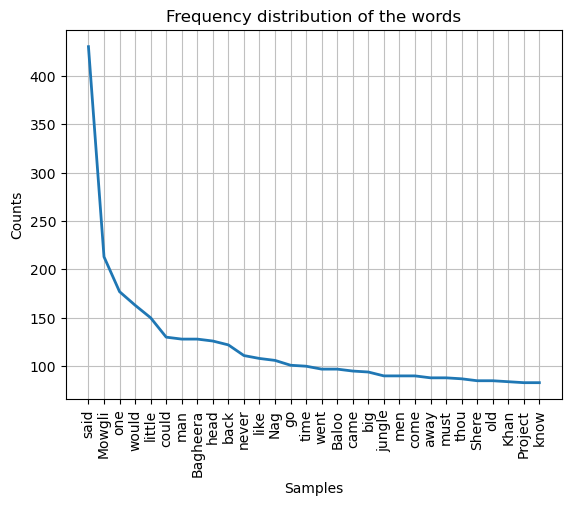

In [181]:
#for question one i am going to use a library called Nltk.

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
import nltk


data = open('jungle_book.txt', 'r').read()

#lets use the word_tokenize function to split the text into words
data = word_tokenize(data)
print(len(data))

#lets make frequency distribution of the words
fdist = FreqDist(data)
print(fdist)


'''Examples of stopwords in English include "the," "and," "of," "to," "in," "a," "is," "at," "on," "as," "it," "with," "by," and so on.
    NLTK provides built-in lists of stopwords for many languages, which can be helpful
'''
#lets remove the stopwords
stop_words = set(stopwords.words('english'))
filtered_data = [word for word in data if word.lower() not in stop_words]
print(len(filtered_data))

#lets remove the punctuations, numbers and special characters
filtered_data = [word for word in filtered_data if word.isalpha()]
print(len(filtered_data))

#lets make frequency distribution of the words
fdist = FreqDist(filtered_data)
print(fdist)

#lets plot the frequency distribution
fdist.plot(30, cumulative=False, title='Frequency distribution of the words')
plt.show()



In [182]:
# Lets calculate the PMI using nltk

from nltk.collocations import BigramCollocationFinder
from nltk.metrics import BigramAssocMeasures

data = open('jungle_book.txt', 'r').read() # read the text file
data = word_tokenize(data) # split the text into words

data = [word.lower() for word in data if word.isalpha()] # convert the words to lowercase and remove non-alphabetic words

finder = BigramCollocationFinder.from_words(data) # create a bigram collocation finder object
finder.apply_freq_filter(10) # apply a frequency filter to remove bigrams that occur less than 10 times
bigram_measures = BigramAssocMeasures() # this is the measure we are going to use to calculate the PMI

scored = finder.score_ngrams(bigram_measures.pmi) # calculate the PMI
scored = sorted(scored, key=lambda x: x[1], reverse=True) # sort the results by PMI in descending order


print(scored[:30]) # print the top 30 results

print(scored[-30:]) # print the bottom 30 results



[(('machua', 'appa'), 12.258806909056164), (('literary', 'archive'), 12.017798809552371), (('united', 'states'), 11.910883605635856), (('archive', 'foundation'), 11.07438233791874), (('gutenberg', 'literary'), 10.811347932084946), (('petersen', 'sahib'), 10.588955510748496), (('electronic', 'works'), 9.963351025529994), (('council', 'rock'), 9.669249834257759), (('black', 'panther'), 9.662956092192271), (('sea', 'vitch'), 9.396310432806098), (('gray', 'brother'), 9.367183070100957), (('shere', 'khan'), 9.291973772991362), (('project', 'gutenberg'), 9.275295031844735), (('sea', 'cow'), 9.226385431363788), (('thou', 'hast'), 8.926825149504882), (('kala', 'nag'), 8.898059565278276), (('two', 'tails'), 8.82881906831135), (('thou', 'art'), 8.764042217306589), (('project', 'electronic'), 8.690332531123577), (('sea', 'catch'), 8.659344838639893), (('monkey', 'people'), 8.532011713922047), (('free', 'people'), 8.464897518063513), (('electronic', 'work'), 8.378388524808836), (('white', 'seal'),

In [186]:
import nltk
from nltk.probability import FreqDist, ConditionalFreqDist
from nltk.tokenize import word_tokenize
import math

# Read and preprocess training data
with open('wiki.train.raw', 'r') as file:
    train_data = file.read()
train_tokens = word_tokenize(train_data.lower())
train_tokens = [word for word in train_tokens if word.isalpha()]

# Create frequency distributions
unigrams = FreqDist(train_tokens)

# Create bigram contexts
bigrams = list(nltk.bigrams(train_tokens))

# Create bigram frequency distribution
bigram_freq_dist = ConditionalFreqDist(bigrams)


# Function to calculate perplexity with add-one smoothing
def perplexity(test_tokens, unigram_probs, bigram_probs):
    N = len(test_tokens)
    log_sum = 0
    V = len(unigram_probs)  # Vocabulary size
    for i in range(1, N):
        bigram = (test_tokens[i - 1], test_tokens[i])
        
        # Calculate unigram probability with add-one smoothing
        if test_tokens[i] in unigram_probs:
            unigram_prob = unigram_probs[test_tokens[i]] / (len(train_tokens) + V)
        else:
            unigram_prob = 1 / (len(train_tokens) + V)
        
        # Calculate bigram probability with add-one smoothing
        if test_tokens[i - 1] in bigram_probs and bigram_probs[test_tokens[i - 1]].freq(test_tokens[i]) > 0:
            bigram_prob = (bigram_probs[test_tokens[i - 1]].freq(test_tokens[i]) + 1) / (unigram_probs[test_tokens[i - 1]] + V)
        else:
            bigram_prob = 1 / V
        
        log_sum += math.log2(bigram_prob)
    
    perplexity = 2 ** (-log_sum / N)
    return perplexity

# Test data preprocessing
with open('wiki.test.raw', 'r') as file:
    test_data = file.read()
test_tokens = word_tokenize(test_data.lower())
test_tokens = [word for word in test_tokens if word.isalpha()]

# Calculate perplexity
perplexity_value = perplexity(test_tokens, unigrams, bigram_freq_dist)
print(f"Perplexity: {perplexity_value:.2f}")


Perplexity: 70483.31


In [187]:
# Validate the results with validation data
with open('wiki.valid.raw', 'r') as file:
    valid_data = file.read()

valid_tokens = word_tokenize(valid_data.lower())
valid_tokens = [word for word in valid_tokens if word.isalpha()]

# Calculate perplexity
perplexity_value = perplexity(valid_tokens, unigrams, bigram_freq_dist)
print(f"Perplexity: {perplexity_value:.2f}")


Perplexity: 70826.77
